In [1]:
#Descarga de módulos preentrenados a travez de Convolutional Neural Networks, MD sin modelos medios entrenados con mayor datos y mayor precision.
!python -m spacy download es_core_news_md

[+] Download and installation successful
You can now load the package via spacy.load('es_core_news_md')


In [2]:
#Importación de las librerias nltk, para la separación de palabras, la frecuencia en la que aparecen, la filtración de stop words y el tageo de palabras
#La importación de la libreria WordCloud para la visualización de palabras destacadas en una nube de palabras
#La libreria spacy para el etiquetado
#La libreria pymongo para la conexión con la BD en MongoDB
import os

import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.tag import StanfordPOSTagger

from wordcloud import WordCloud

import spacy
from spacy import displacy
import es_core_news_md

from pymongo import MongoClient

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"
os.environ["JAVAHOME"] = "/usr/bin/java"

In [4]:
#Carga de los módulos descargados en la varible nlp
nlp = es_core_news_md.load()

In [7]:
# Creanción de la conección con la BD de MongoDB
client = MongoClient("localhost", 27017)
db = client["noticias"]
collection0 = db["educacion"]
collection1 = db["empresa"]
collection2 = db["judicial"]
collection3 = db["macroeconomia"]
collection4 = db["politica"]

In [8]:
#Guardado de colecciones en un solo arreglo para su mejor manipulación e impresión del contenido del arreglo creado
colecciones = [collection0 , collection1, collection2, collection3, collection4] 
colecciones

[Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'noticias'), 'educacion'),
 Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'noticias'), 'empresa'),
 Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'noticias'), 'judicial'),
 Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'noticias'), 'macroeconomia'),
 Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'noticias'), 'politica')]

In [9]:
#Recorrido de la información contenida en el arreglo principal, después recorrido de cada información referente al Title, summary y fulltext
text = []
for collection in colecciones:
    for news in list(collection.find({}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
        text.append(news["title"])
        text.append(news["summary"])
        text.append(news["full_text"])

In [10]:

text = " ".join(text)

In [11]:
#Impresión de la variable con el texto obtenido de MongoDB
text

'Del 18 al 21 de abril se aplicarán las Pruebas Saber 3°, 5°, 7° y 9° 200.000 estudiantes, de 1.300 sedes educativas seleccionadas en los 32 departamentos del país, deberán realizar la prueba. El Ministerio de Educación Nacional y el Instituto Colombiano para la Evaluación de la Educación (Icfes) anunciaron que entre el 18 y el 21 de abril se aplicarán las Pruebas Saber para los grados 3°, 5°, 7° y 9°. 200.000 estudiantes, de 1.300 sedes educativas seleccionadas en los 32 departamentos del país, deberán realizar la prueba en esta ocasión.  María Victoria Angulo, ministra de Educación, reconoció el trabajo que han adelantado los rectores y rectoras del país y les hizo un llamado para que las pruebas se hagan presencialmente, bajo la modalidad de papel y lápiz, recordando que el componente virtual se realizó durante 2021. Sin embargo, para la población con discapacidad, la prueba será electrónica. (Puede leer: Estos 18 programas universitarios colombianos están entre los 100 mejores del 

In [12]:
#Separación del texto en palabras que sera contenida en la variable words
words = word_tokenize(text)

In [13]:
#Impresión de las primeras 10 palabras de todo el texto ya separado
words[:10]

['Del', '18', 'al', '21', 'de', 'abril', 'se', 'aplicarán', 'las', 'Pruebas']

In [14]:
#Verificación de la frecuencia de cada palabra encontrada, almacenada en la variable frec_dist
frec_dist = FreqDist(words)

In [15]:
#Impresión de las 10 palabras mas frecuentes
frec_dist.most_common(10)

[('de', 15015),
 (',', 12852),
 ('la', 8341),
 ('.', 7140),
 ('que', 6648),
 ('en', 6343),
 ('el', 6087),
 ('y', 5395),
 ('a', 4309),
 ('los', 3789)]

In [16]:
#Se indica que el idioma a analizar es Español y se asigna en la variable stop_words
stop_words = set(stopwords.words("spanish"))

In [17]:
#Creación de un arreglo vacío y filtración de todo el texto para la eliminación de las stop words
filtered_words = []

for w in words:
    if w.lower() not in stop_words:
        filtered_words.append(w)

In [18]:
#Verificación de la frecuencia de cada palabra encontrada ya eliminando las stop words
frec_dist_filtered = FreqDist(filtered_words)

In [19]:
#Impresión de las 10 palabras mas frecuentes sin stop words
frec_dist_filtered.most_common(10)

[(',', 12852),
 ('.', 7140),
 ('“', 1629),
 ('”', 1602),
 (':', 1228),
 (')', 1134),
 ('(', 1125),
 ('%', 898),
 ('Colombia', 465),
 ('país', 427)]

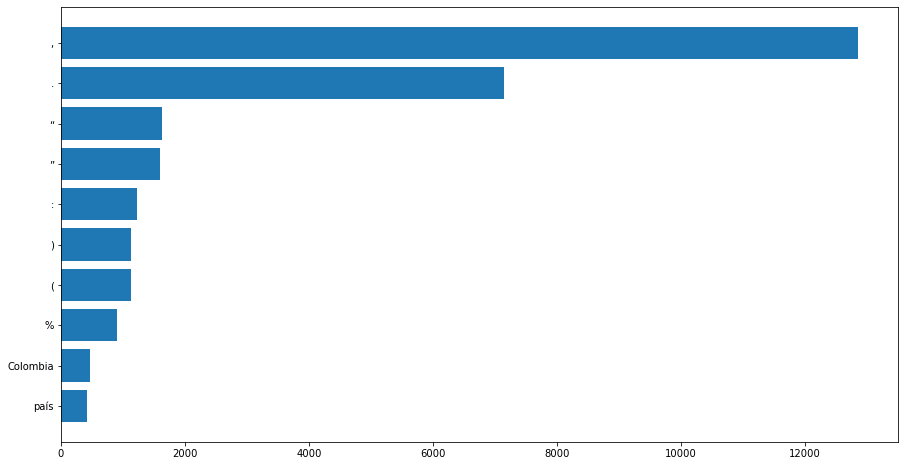

In [20]:
#Creación de una gráfica de 10 valores con la frecuencia en la que aparece cada una de las palabras
n = 10

plt.figure(figsize = (15, 8))
plt.barh([ w[0] for w in frec_dist_filtered.most_common(n) ], [ w[1] for w in frec_dist_filtered.most_common(n) ])
plt.gca().invert_yaxis()

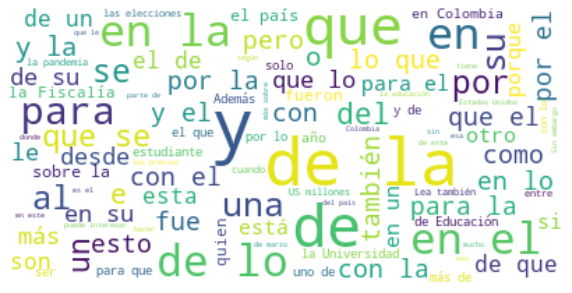

In [21]:
#Creación de la nube de palabras con la frecuencia de cada una de ellas, esta nube aún contiene las stop words
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "white").generate(text)

plt.figure(figsize = (10, 10))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

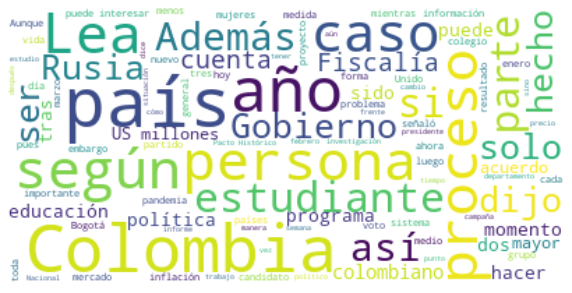

In [22]:
#Creación de la nube de palabras con la frecuencia de cada una de ellas, esta nube ya no contiene las stop words
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "white").generate(" ".join(filtered_words))

plt.figure(figsize = (10, 10))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

In [25]:
#Realización del tageo de cada palabra al texto filtrado, indicando el códificado de utf8 para los acentos 
pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tags = pos_tagger.tag(filtered_words)

In [26]:
#Identificación e impresión de las palabras tageadas
pos_tags.sort(key = lambda tup: tup[1])
pos_tags

[('educativas', 'ADJ'),
 ('seleccionadas', 'ADJ'),
 ('educativas', 'ADJ'),
 ('seleccionadas', 'ADJ'),
 ('rectoras', 'ADJ'),
 ('llamado', 'ADJ'),
 ('virtual', 'ADJ'),
 ('electrónica', 'ADJ'),
 ('universitarios', 'ADJ'),
 ('colombianos', 'ADJ'),
 ('mejores', 'ADJ'),
 ('vital', 'ADJ'),
 ('educativo', 'ADJ'),
 ('darnos', 'ADJ'),
 ('claras', 'ADJ'),
 ('cercana', 'ADJ'),
 ('educativo', 'ADJ'),
 ('adolescentes', 'ADJ'),
 ('básica', 'ADJ'),
 ('primaria', 'ADJ'),
 ('secundaria', 'ADJ'),
 ('evaluados', 'ADJ'),
 ('relacionadas', 'ADJ'),
 ('comunicativas', 'ADJ'),
 ('matemáticas', 'ADJ'),
 ('quinto', 'ADJ'),
 ('séptimo', 'ADJ'),
 ('noveno', 'ADJ'),
 ('naturales', 'ADJ'),
 ('ambiental', 'ADJ'),
 ('ciudadano', 'ADJ'),
 ('último', 'ADJ'),
 ('comunicativas', 'ADJ'),
 ('auxiliares', 'ADJ'),
 ('socioeconómica', 'ADJ'),
 ('asociados', 'ADJ'),
 ('socioemocionales', 'ADJ'),
 ('directores', 'ADJ'),
 ('segundo', 'ADJ'),
 ('mencionado', 'ADJ'),
 ('afuera', 'ADJ'),
 ('debido', 'ADJ'),
 ('muestral', 'ADJ'),
 ('

In [32]:
#Carga de los módulos de análisis de texto
nlp = spacy.load('en_core_web_sm') 
nlp.max_length = 1500000

In [33]:
#Etiquedado de cada palabra relevante por medio de displacy
document = nlp(text)
displacy.render(document, style = "ent")